#### get peak from model, test timinig to peak from mobility data at different levels of reduction

In [ ]:
import pandas as pd

from covid_model_deaths.data import get_input_data, moving_average

import peak_detector

import warnings
warnings.simplefilter('ignore')


#### load input data

In [2]:
# get data, create name column
df = get_input_data('full_data')
df['locaton_label'] = df.apply(
    lambda x: x['Province/State'] + ' - '+ x['Country/Region'] if x['Province/State'] is not np.nan
        else x['Country/Region'], 
    axis=1
)

# id
df['location_id'] = df['location_id'].astype(int)

# get days
df['day0'] = df.groupby('location_id', as_index=False)['Date'].transform(min)
df['Days'] = df.apply(lambda x: (x['Date'] - x['day0']).days, axis=1)

# get ln
df.loc[df['Confirmed case rate'] == 0, 'Confirmed case rate'] = 0.1 / df['population']
df.loc[df['Death rate'] == 0, 'Death rate'] = 0.1 / df['population']
df['ln(confirmed case rate)'] = np.log(df['Confirmed case rate'])
df['ln(death rate)'] = np.log(df['Death rate'])
df = df[['location_id', 'locaton_label', 'Date', 'Days', 'population', 
         'ln(confirmed case rate)', 'ln(death rate)']].sort_values(['location_id', 'Date']).reset_index(drop=True)

# get Google moblity data, subset covid data to places where we have mobility data
mob_df = pd.read_csv(
    '/ihme/covid-19/snapshot-data/best/covid_onedrive/Decrees for Closures/Google/google_mobility_with_locs.csv'
)
mob_df = mob_df.loc[
    ~mob_df[['retail_and_recreation_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline']]
    .isnull().any(axis=1)
]
mob_df['mobility'] = mob_df[
    ['retail_and_recreation_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline']
].mean(axis=1)
mob_df['date'] = pd.to_datetime(mob_df['date'])
mob_df = mob_df[['location_id', 'location_name', 'date', 'mobility']]
df = df.loc[df['location_id'].isin(mob_df['location_id'].unique().tolist())]

# separate into list of location-specific datasets (for smoothing)
loc_dfs = [df.loc[df['location_id'] == l].reset_index(drop=True) for l in df.location_id.unique()]


#### method for getting days to peak

In [3]:
def get_days_to_peak(df, d, pct_declines=np.arange(20, 90, 10)):
    df['time_to_peak'] = df['date'].apply(lambda x: (pd.to_datetime(d) - x).days)
    timings = []
    for pct_decline in pct_declines:
        t = df.loc[df['mobility'] < -pct_decline, 'time_to_peak'].reset_index(drop=True)
        if len(t) > 0:
            timings.append(t[0])

    t_df = pd.DataFrame(np.array([timings]), columns=[f'pct_{pct}' for pct in pct_declines[:len(timings)]])

    return pd.concat([df.loc[[0], ['location_id', 'location_name']], t_df], axis=1)


#### smooth data, calculate peaks

Prepping data...
Calculating potential peaks...
266 -> 59
Plotting locations: 13.0, 18.0, 44.0, 47.0, 49.0, 71.0, 75.0, 78.0, 80.0, 82.0, 87.0, 89.0, 91.0, 94.0, 143.0, 146.0, 201.0, 385.0, 526.0, 541.0, 555.0, 563.0, 565.0, 568.0, 35494.0, 35496.0, 35497.0, 35500.0, 35501.0, 35502.0, 35503.0, 35504.0, 35505.0, 35506.0, 35507.0, 35509.0, 35511.0, 35512.0, 35513.0, 35514.0, 43858.0, 60357.0, 60358.0, 60359.0, 60360.0, 60361.0, 60362.0, 60363.0, 60364.0, 60365.0, 60366.0, 60368.0, 60370.0, 60371.0, 60372.0, 60374.0, 60376.0, 60377.0, 60384.0
Prepping data...
Calculating potential peaks...
244 -> 134
Plotting locations: 10.0, 44.0, 45.0, 46.0, 47.0, 49.0, 51.0, 54.0, 55.0, 58.0, 59.0, 60.0, 72.0, 75.0, 76.0, 78.0, 79.0, 82.0, 85.0, 87.0, 88.0, 89.0, 90.0, 91.0, 93.0, 94.0, 97.0, 98.0, 99.0, 107.0, 119.0, 125.0, 126.0, 129.0, 132.0, 136.0, 143.0, 144.0, 146.0, 155.0, 183.0, 185.0, 196.0, 201.0, 213.0, 218.0, 385.0, 524.0, 528.0, 532.0, 533.0, 534.0, 535.0, 541.0, 542.0, 545.0, 546.0, 547.0

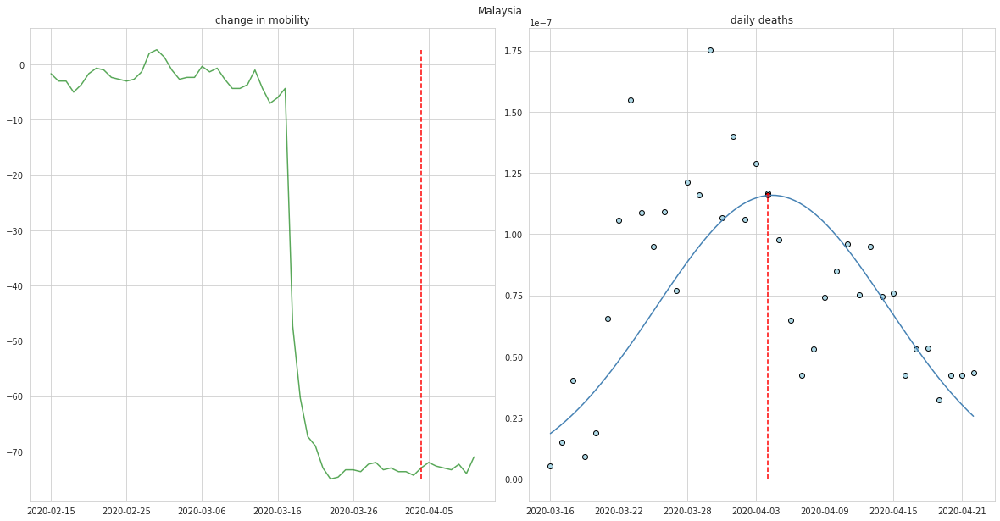

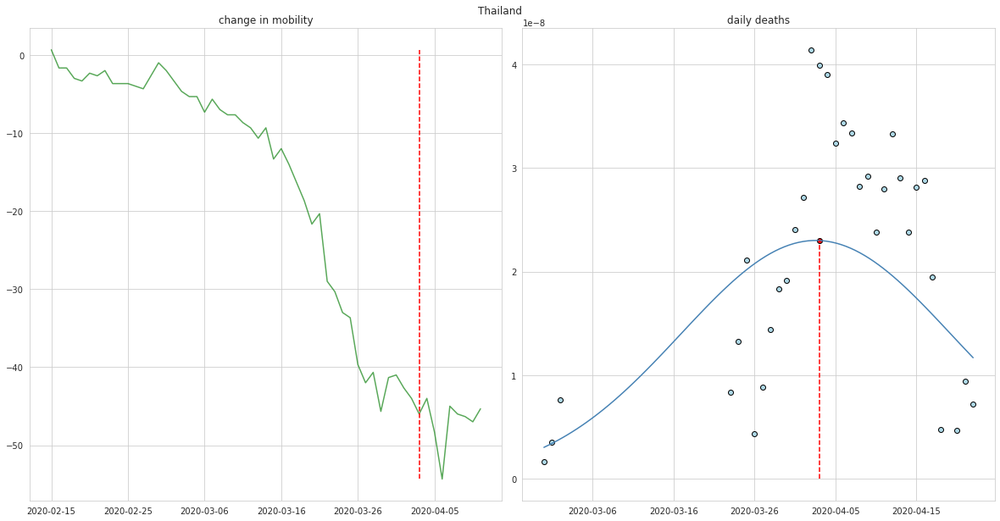

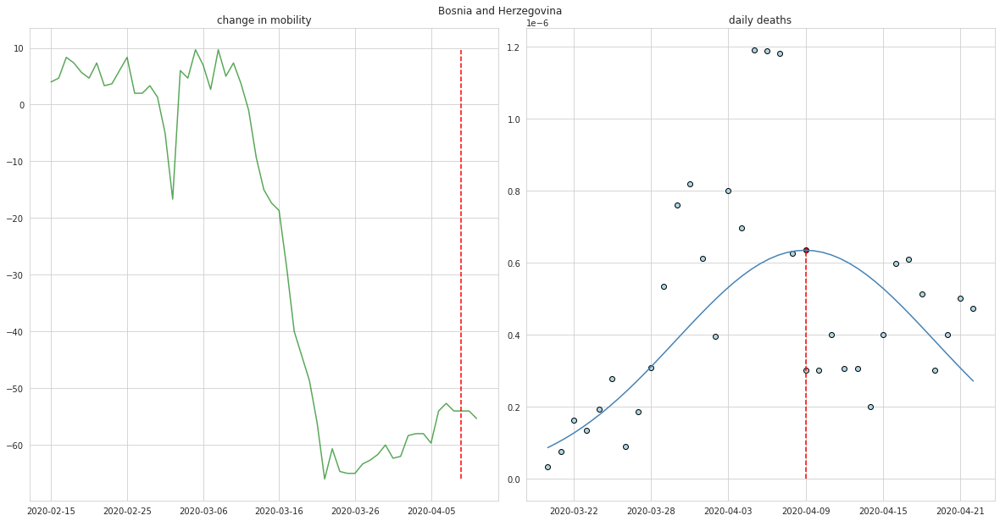

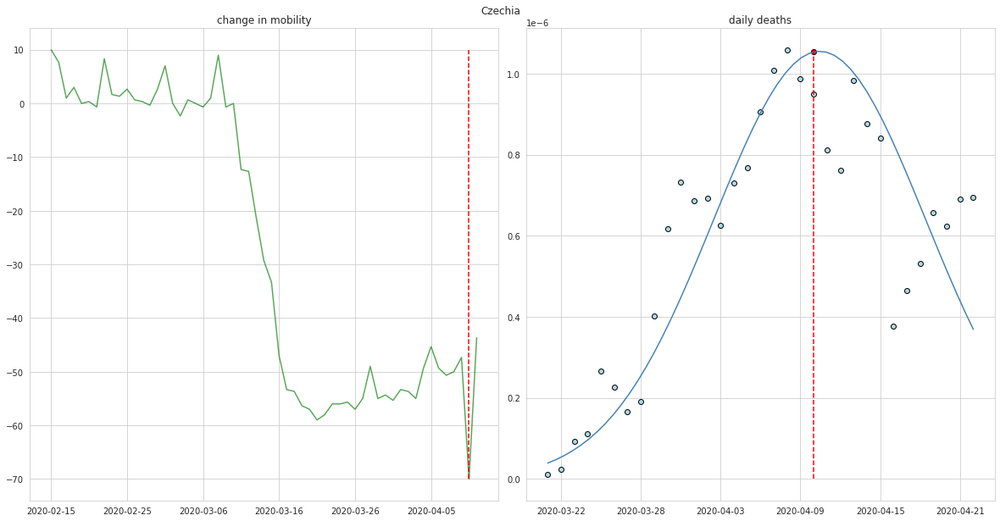

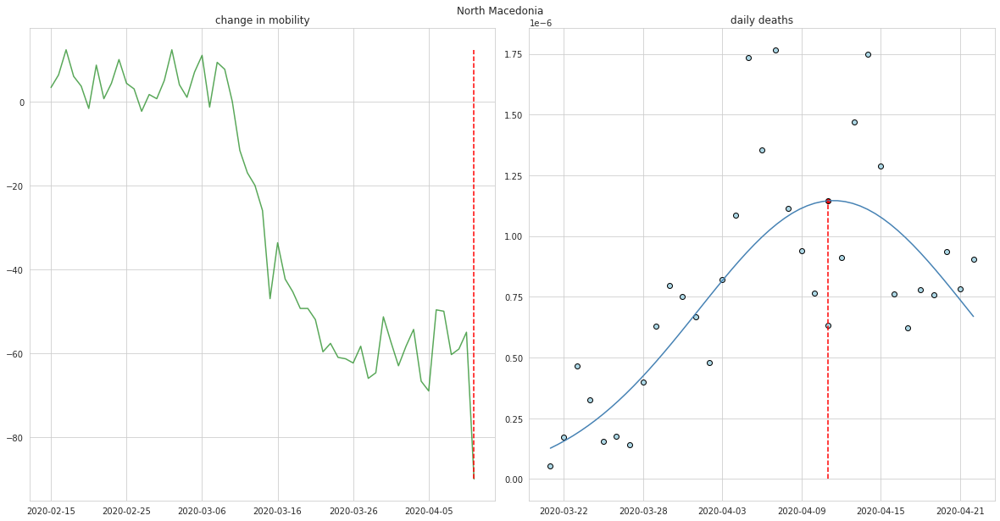

...

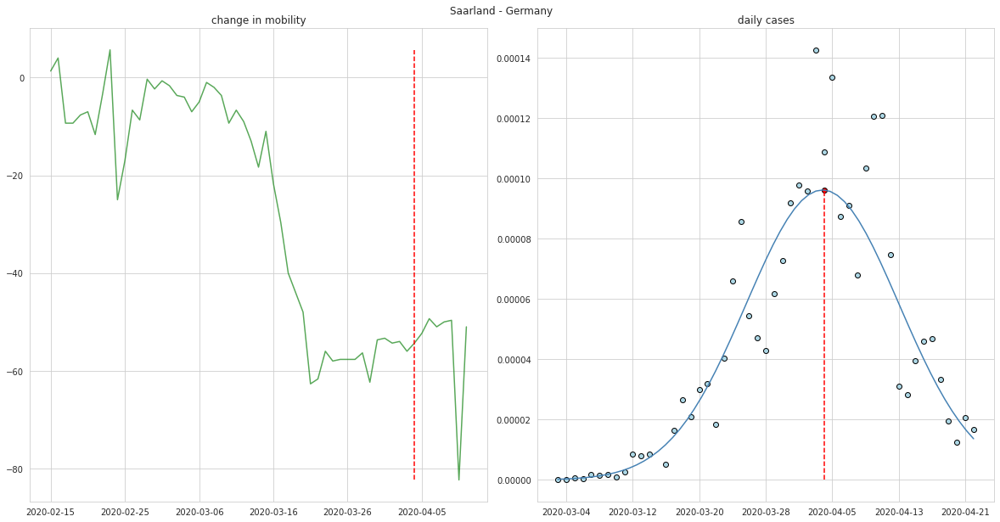

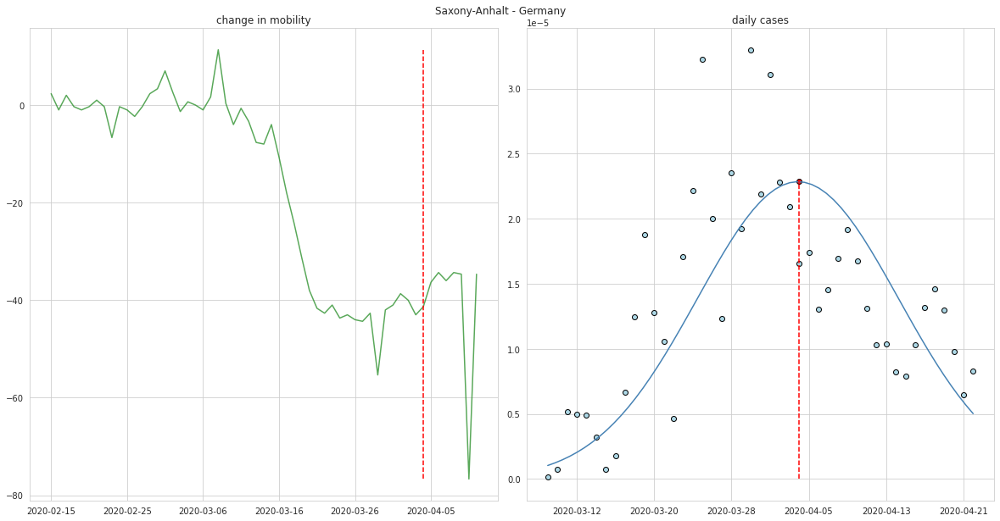

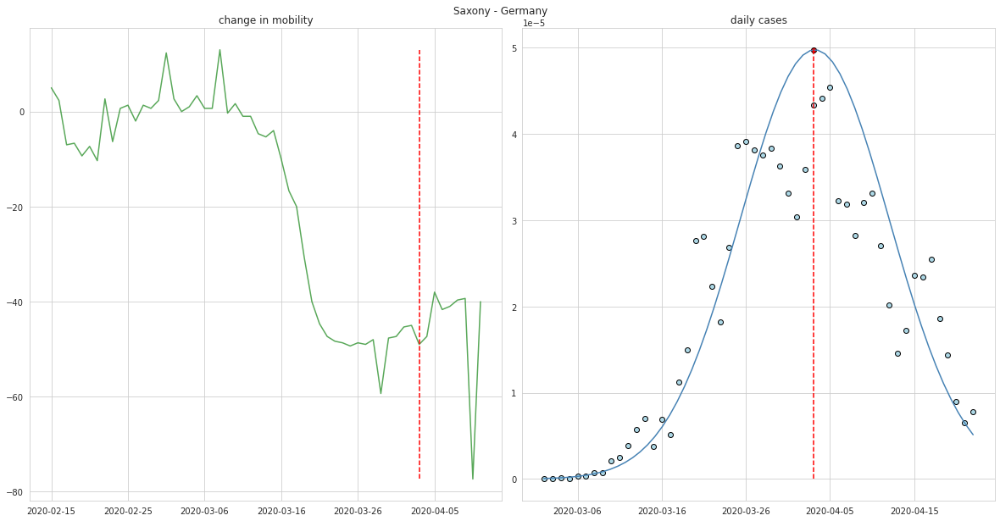

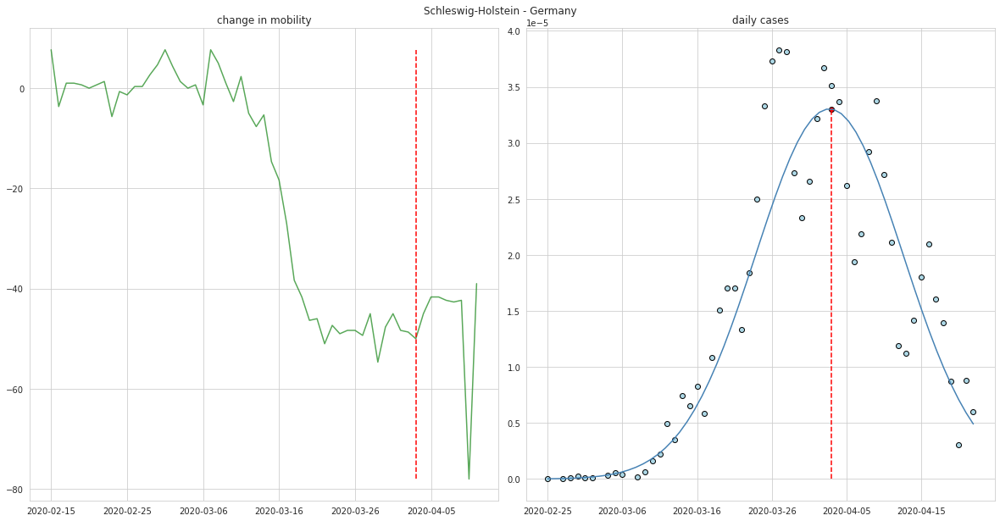

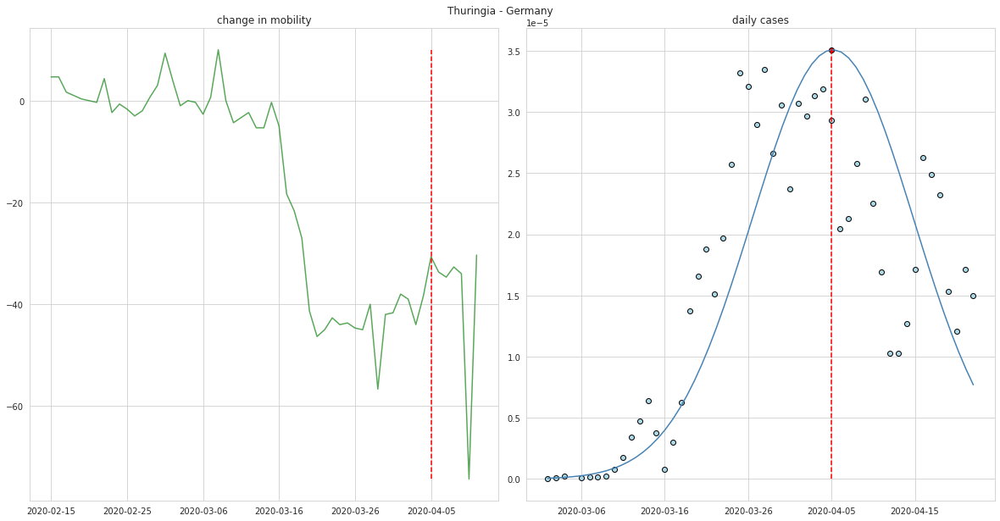

In [4]:
for ln_rate_var, measure_label in [('ln(death rate)', 'deaths'), ('ln(confirmed case rate)', 'cases')]:
    # get that peak
    input_df = pd.concat([moving_average(loc_df, ln_rate_var) for loc_df in loc_dfs])
    input_df['rate'] = np.exp(input_df[ln_rate_var])
    input_df = input_df[['location_id','locaton_label', 'Date', 'Days', 'rate']]
    model_df, date_df = peak_detector.prep_data(input_df, 'rate')
    potential_peaked_groups, potential_peaked_names, poly_fit = peak_detector.create_potential_peaks(
        model_df, input_df
    )
    data, peak_date, peak_day = peak_detector.calc_peaks(date_df, model_df, potential_peaked_groups, poly_fit)
    peak_detector.plot_peak_and_mobility(
        potential_peaked_groups, data, poly_fit, peak_date, peak_day, 
        mob_df,
        measure_label=measure_label, 
        out_path=f'/ihme/homes/rmbarber/covid-19/{measure_label}_30_10.pdf'
    )

    # store days to peak from mobility thresholds
    pct_df = pd.concat([get_days_to_peak(mob_df.loc[mob_df['location_id'] == l].reset_index(drop=True), d) for l, d in peak_date.items()])
    pct_cols = [i for i in pct_df.columns if i.startswith('pct')]
    dfs = []
    for pct_col in pct_cols:
        dfs.append(
            pd.DataFrame({
                'measure':measure_label,
                'pct_reduction_mobility': pct_col.split('_')[1],
                'n': len(pct_df) - pct_df[pct_col].isnull().sum(),
                'days_to_peak_mean': pct_df[pct_col].mean(),
                'days_to_peak_std': pct_df[pct_col].std()
            }, index=[0])
        )
    df = pd.concat(dfs)
    df.to_csv(f'/ihme/homes/rmbarber/covid-19/{measure_label}_30_10.csv', index=False)
